In [17]:
!conda install -c conda-forge nodejs -y

Solving environment: done

# All requested packages already installed.



In [ ]:
!jupyter labextension install jupyterlab-plotly

/home/moqri/anaconda3/envs/era/lib/python3.9/site-packages/jupyter_server/transutils.py:13: FutureWarning: The alias `_()` will be deprecated. Use `_i18n()` instead.
  warnings.warn(warn_msg, FutureWarning)
Building jupyterlab assets (production, minimized)
/

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

In [7]:
data='../../rna/'

In [156]:
a=['SRR10836663','SRR10836666','SRR10836680']
t=['SRR10836677','SRR10836678','SRR10836679']
y=['SRR10836675','SRR10836676']
for s in a+t+y:
    if s=='SRR10836663':
        df=pd.read_csv(data+'end/'+s+'/quant.sf',sep='\t',index_col=0)[['TPM']]
        df.columns=[s]
    else:
        d=pd.read_csv(data+'end/'+s+'/quant.sf',sep='\t',index_col=0)[['TPM']]
        d.columns=[s]
        df=df.merge(d,left_index=True,right_index=True)
df=df[t+y+a]
print(df.shape)
df.head(1)

(177456, 8)


,SRR10836677,SRR10836678,SRR10836679,SRR10836675,SRR10836676,SRR10836663,SRR10836666,SRR10836680
Name,,,,,,,,
ENST00000631435.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [157]:
df.sum().values

array([ 999999.99997901, 1000000.00009   , 1000000.00007099,
       1000000.000096  ,  999999.99987401,  999999.99998501,
       1000000.000017  , 1000000.000105  ])

In [8]:
a=['SRR10836665','SRR10836673','SRR10836664']
t=['SRR10836670','SRR10836671','SRR10836672']
y=['SRR10836667','SRR10836668','SRR10836669']
for s in a+t+y:
    if s=='SRR10836665':
        df=pd.read_csv(data+'fib/'+s+'/quant.sf',sep='\t',index_col=0)[['TPM']]
        df.columns=[s]
    else:
        d=pd.read_csv(data+'fib/'+s+'/quant.sf',sep='\t',index_col=0)[['TPM']]
        d.columns=[s]
        df=df.merge(d,left_index=True,right_index=True)
df=df[t+y+a]
print(df.shape)
df.head(1)

(177456, 9)


,SRR10836670,SRR10836671,SRR10836672,SRR10836667,SRR10836668,SRR10836669,SRR10836665,SRR10836673,SRR10836664
Name,,,,,,,,,
ENST00000631435.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [9]:
df.sum().values

array([ 999999.999888,  999999.999947,  999999.999901, 1000000.00002 ,
        999999.999975, 1000000.000069, 1000000.000013, 1000000.000002,
        999999.999942])

In [10]:
df.loc['ENST00000541267.5']

SRR10836670    13108.577894
SRR10836671     3266.310915
SRR10836672     6306.836092
SRR10836667        0.000000
SRR10836668        0.000000
SRR10836669        0.000000
SRR10836665        0.000000
SRR10836673        0.000000
SRR10836664        0.000000
Name: ENST00000541267.5, dtype: float64

In [11]:
df[df>0].count()

SRR10836670    83991
SRR10836671    83390
SRR10836672    85850
SRR10836667    77276
SRR10836668    73367
SRR10836669    81508
SRR10836665    69096
SRR10836673    35536
SRR10836664    40406
dtype: int64

In [59]:
dfd=df[(df[df>0].count(1)<9) & (df[df>0].count(1)>0)]
dfd[dfd>0].count()

In [42]:
dg=pd.read_csv('../data/mart_export.txt.gz',sep='\t',index_col=1)
dg.shape

(226265, 2)

In [65]:
dg.merge(dfd,left_index=True,right_index=True)

,Gene stable ID,HGNC symbol,SRR10836670,SRR10836671,SRR10836672,SRR10836667,SRR10836668,SRR10836669,SRR10836665,SRR10836664


In [ ]:
df['a']=df[a].mean(1)
df['t']=df[t].mean(1)
df['y']=df[y].mean(1)
df['ta']=((df.t)-(df.a))
df['ya']=((df.y)-(df.a))
df.shape

In [13]:
df.sort_values('ta')

,SRR10836670,SRR10836671,SRR10836672,SRR10836667,SRR10836668,SRR10836669,SRR10836665,SRR10836673,SRR10836664,a,t,y,ta,ya
Name,,,,,,,,,,,,,,
ENST00000631435.1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-inf,-inf
ENST00000446977.2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-inf,-inf
ENST00000399676.3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-inf,-inf
ENST00000344692.7,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-inf,-inf
ENST00000520021.5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-inf,-inf
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENST00000645499.1,0.000000,0.000000,0.207475,0.028270,0.036202,0.587837,0.314932,0.000000,0.000000,0.104977,0.069158,0.217436,NaN,-2.185167
ENST00000634119.1,0.000000,0.061909,0.380758,0.000000,0.000000,0.000000,0.000000,3.665957,1.568744,1.744900,0.147556,0.000000,NaN,NaN
ENST00000631874.1,17.666262,0.000000,0.000000,4.989866,0.000000,0.000000,41.675722,0.000000,0.000000,13.891907,5.888754,1.663289,NaN,NaN


In [15]:
fig = px.scatter(df, x="ta", y="ya", log_x=True,log_y=True,width=1000, height=800, #hover_data=['gene']
                labels={
                     "ta": "Trated vs Aged",
                     "ya": "Young vs Aged",
                 },
                )
fig.show()

In [72]:
d=np.log2(df)
d=d[(d.ay>5)|(d.ya>5)]
print(d.shape)

(4959, 15)


/scg/apps/software/jupyter/python_3.7/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log2
  """Entry point for launching an IPython kernel.


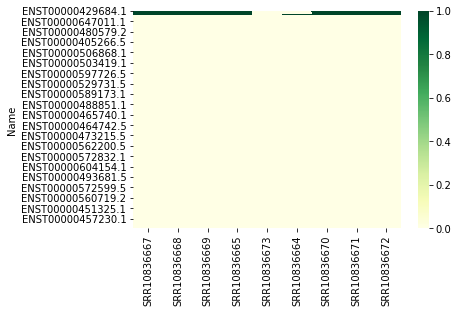

In [73]:
d['m']=d[y+a].mean(1)
for c in d.columns:
    d[c]=d[c]-d.m
d=d.sort_values('y')
sns.heatmap(d[y+a+t]<0,cmap="YlGn")

In [74]:
dg=pd.read_csv('../data/mart_export.txt',sep='\t',index_col=2).merge(df,left_index=True,right_index=True)
dg=dg[~dg['Gene name'].str.startswith('MT-')]
dg.shape

FileNotFoundError: [Errno 2] File b'../data/mart_export.txt' does not exist: b'../data/mart_export.txt'

In [126]:
tfs=pd.read_csv('http://humantfs.ccbr.utoronto.ca/download/v_1.01/DatabaseExtract_v_1.01.csv',index_col=1)[['HGNC symbol']]
dg=dg[dg['Gene stable ID'].isin(tfs.index)]

In [127]:
#dg=dg.groupby('Gene stable ID').mean()
aa=['GSM4227385','GSM4227387','GSM4227389','GSM4227391']
for c in aa:
    dg[c]=dg.a
tt=['GSM4227386','GSM4227388','GSM4227390','GSM4227392']
for c in tt:
    dg[c]=dg.t
dg[aa+tt].round(2).to_csv('../data/expf.csv')

In [128]:
dg['gene']=dg['Gene name']
dg=dg[~dg.gene.str.startswith('RP')]

In [129]:
#dg=dg[['gene','ta','ya','a','y','t']].groupby('gene').median()
#dg['gene']=dg.index

In [130]:
dg.shape

(19812, 26)

In [131]:
dg=dg[dg.t>1]
dg[['gene','a','y','t','ya','ta']].sort_values('ta').tail(50)

,gene,a,y,t,ya,ta
ENST00000496096.5,TIA1,0.000000,2.472559,3.958052,24.725590,39.580523
ENST00000504557.1,HOXC9,0.000000,7.229349,3.989013,72.293487,39.890133
ENST00000481694.1,TBPL1,0.000000,2.780844,4.063209,27.808437,40.632090
ENST00000423703.6,ING4,0.000000,1.466457,4.084810,14.664570,40.848100
ENST00000482512.5,GOLGB1,0.025335,0.414122,5.195153,3.304115,41.450025
ENST00000472923.5,UBE2V1,0.000000,3.019228,4.146204,30.192283,41.462037
ENST00000381556.6,MYBBP1A,0.000000,1.652596,4.196352,16.525960,41.963523
ENST00000630638.1,EXOG,0.000000,0.000000,4.265481,0.000000,42.654813
ENST00000519742.5,CLU,0.000000,1.136454,4.362852,11.364537,43.628517
ENST00000464404.2,KLF5,0.000000,1.877265,4.481410,18.772650,44.814097


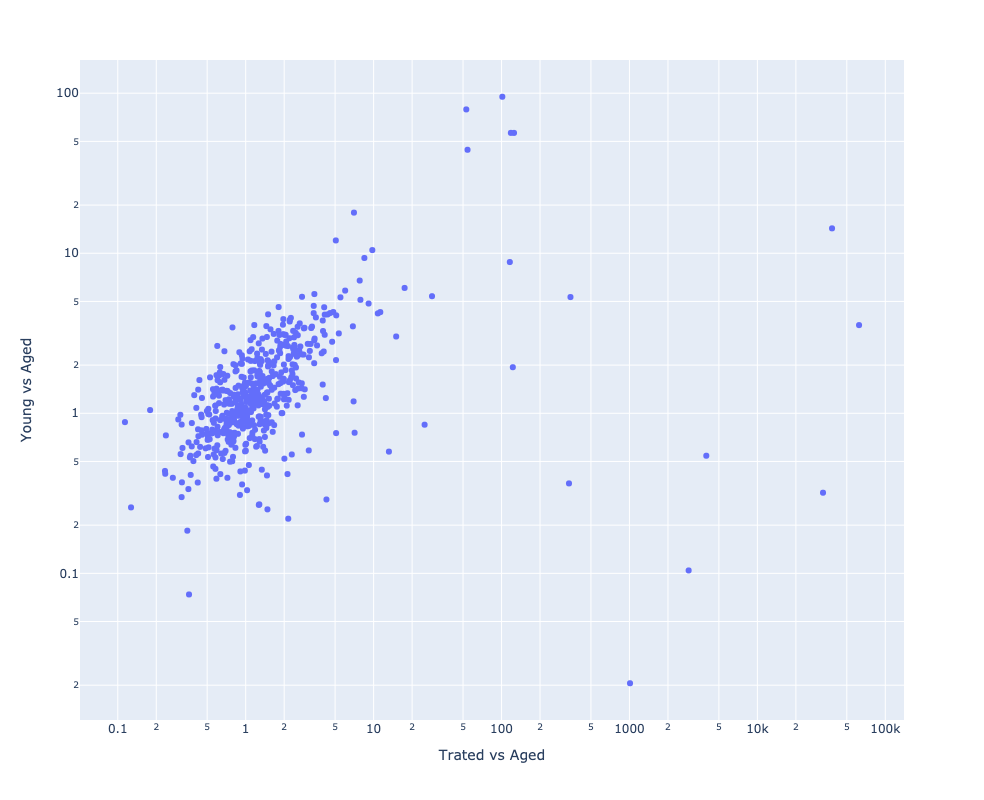

In [122]:
fig = px.scatter(dg, x="ta", y="ya",hover_data=['gene'], log_x=True,log_y=True,width=1000, height=800,
                labels={
                     "ta": "Trated vs Aged",
                     "ya": "Young vs Aged",
                 },
                )
fig.show()

In [20]:
dg['ya']=dg.y-dg.a
dg['ta']=dg.t-dg.a

dg[['a','y','t','ta','ya']].sort_values('ya').tail(20)

,a,y,t,ta,ya
MYL6,1120.384764,1663.942782,1705.261223,584.876459,543.558018
PPIA,971.492354,1518.927373,1244.630942,273.138588,547.435019
TMSB4XP6,474.577921,1035.793859,785.241693,310.663772,561.215938
RPL31,993.516894,1565.678789,1563.495540,569.978646,572.161896
RPL21P16,500.867084,1087.818419,902.772285,401.905201,586.951334
RNA5SP202,273.846763,863.573716,505.241635,231.394872,589.726953
RPS17,1141.764582,1734.112634,1447.342986,305.578404,592.348051
TUBA1B,1853.437710,2450.705141,936.015898,-917.421812,597.267430
RPL39P3,477.009874,1081.964329,958.890108,481.880234,604.954455
RPS19,1646.891304,2281.141942,2361.423171,714.531867,634.250639


In [23]:
dg[dg.index.str.startswith('FOS')][['a','y','t','ta','ya']].sort_values('ta')

,a,y,t,ta,ya
FOSL1,21.048330,16.437560,7.684795,-13.363536,-4.610770
FOSL1,10.170886,4.872546,2.434058,-7.736828,-5.298340
FOSL1,7.306826,6.858443,5.131711,-2.175115,-0.448383
FOSL1,4.969031,1.693283,3.185143,-1.783888,-3.275747
FOS,1.969997,3.777029,0.548918,-1.421079,1.807032
FOSB,1.257984,0.029494,0.000000,-1.257984,-1.228490
FOSL2,4.432447,6.089121,3.217552,-1.214896,1.656673
FOS,0.533055,2.591709,0.145102,-0.387953,2.058654
FOSB,0.133092,0.942643,0.000000,-0.133092,0.809551
FOSB,0.110301,0.821597,0.076816,-0.033486,0.711295


In [35]:
dg[dg.index.str.startswith('SAP30')][['a','y','t','ta','ya']].sort_values('ta')

,a,y,t,ta,ya
SAP30L,14.409211,7.804880,1.896159,-12.513052,-6.604331
SAP30BP,9.060383,0.193185,0.000000,-9.060383,-8.867199
SAP30BP,8.059345,0.378748,0.849036,-7.210309,-7.680597
SAP30BP,11.421996,8.412934,6.780633,-4.641363,-3.009062
SAP30BP,4.503870,0.453924,0.531557,-3.972313,-4.049946
SAP30BP,15.408865,17.511408,11.466237,-3.942628,2.102543
SAP30L,5.046981,2.977593,1.288732,-3.758249,-2.069388
SAP30BP,9.057478,4.740166,5.623798,-3.433681,-4.317313
SAP30L,0.885796,0.589325,0.000000,-0.885796,-0.296471
SAP30BP,7.955739,9.503253,7.747586,-0.208153,1.547514


In [349]:
rp=dg[dg['Gene name'].str.startswith('RPL') | dg['Gene name'].str.startswith('RPS')]

<AxesSubplot:xlabel='ta', ylabel='ya'>

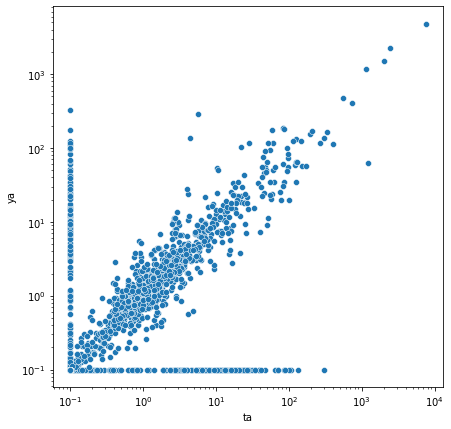

In [386]:
f,ax=f, ax = plt.subplots(figsize=(7, 7))
ax.set(xscale="log", yscale="log")
sns.scatterplot(data=rp[['ta','ya']]+.1,x='ta',y='ya',ax=ax)

In [387]:
rna=dg[dg['Gene name'].str.startswith('RNA') ]

<AxesSubplot:xlabel='ta', ylabel='ya'>

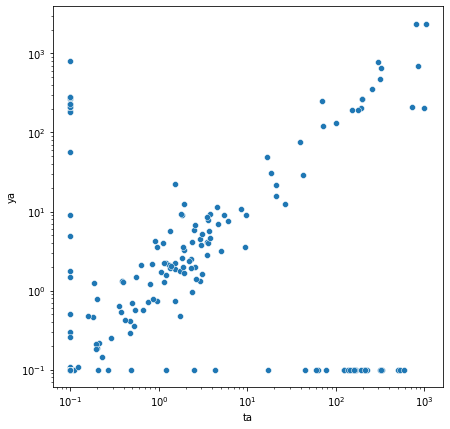

In [389]:
f,ax=f, ax = plt.subplots(figsize=(7, 7))
ax.set(xscale="log", yscale="log")
sns.scatterplot(data=rna[['ta','ya']]+.1,x='ta',y='ya',ax=ax)